# シグナルありデータ生成

In [1]:
DEBUG = True
#DEBUG = False

#IS_ISO = True
IS_ISO = False

OUTDIR = "/volume/kaggle/g2net2/pyfstat_output/tmp_signal"
#OUTDIR = "/volume/kaggle/g2net2/pyfstat_output/ex004_generating_signal_gap"
IS_DEL_OUTDIR = True

TMP_OUTDIR = "my_generating_signal"

GAP_N_LEN = 50

In [2]:
# Parameters
TMP_OUTDIR = "my_generating_signal"
OUTDIR = "/volume/kaggle/g2net2/pyfstat_output/ex004_generating_signal_gap"
GAP_N_LEN = 50
IS_ISO = False
IS_DEL_OUTDIR = True
DEBUG = False


In [3]:
#!pip install h5py
#!pip install pandas
import h5py
import pandas as pd

In [4]:
import os
import glob
import shutil
import numpy as np
from tqdm.notebook import tqdm
from scipy import stats

import pyfstat
from pyfstat.utils import get_sft_as_arrays

# Local module to simplify plotting
import tutorial_utils

logger = pyfstat.set_up_logger(label="my_generating_signal", log_level="INFO")

%matplotlib inline

22-11-14 14:15:09.256 pyfstat INFO    : Running PyFstat version 1.18.1+84.5ded4a67.clean


22-11-14 14:15:09.360 pyfstat.utils.importing INFO    : No $DISPLAY environment variable found, so importing matplotlib.pyplot with non-interactive 'Agg' backend.


In [5]:
# ================================================
# 生成したhdf5ファイルロードできるか確認
# ================================================
import h5py
from pathlib import Path

def load_hdf5(h_path):
    """hdf5ファイルロード"""
    with h5py.File(h_path, 'r') as f:
        g = f[file_id]

        # [:]を最後につけないと取り出せないので注意
        freq = g['frequency_Hz'][:]  # shape: (360,) 各振動数

        h1_a = g["H1"]['SFTs'][:]
        h1_t = g["H1"]['timestamps_GPS'][:]

        l1_a = g["L1"]['SFTs'][:]
        l1_t = g["L1"]['timestamps_GPS'][:]
    
    return freq, h1_a, l1_a, h1_t, l1_t

# gen_gap_noise_signal

In [6]:
def gen_gap_noise_signal_detectors(out_path, file_id, sqrtSX, F0, prob_gap, detectors, tref, signal_parameters, 
                                  tmp_out_dir=TMP_OUTDIR):
    """detectors指定してgapノイズ+シグナルデータを生成
    gapノイズ(timestamps)は非定常の duration, tstart と併用できなかった
    """
    
    # Setup Writer
    writer_kwargs = {
        "outdir": tmp_out_dir,
        "detectors": detectors,  # シミュレーションする検出器(ここではLIGOハンフォード)
        "Tsft": 1800,  # フーリエ変換の継続時間
        "SFTWindowType": "tukey",  # 短時間フーリエ変換を計算するための窓関数
        "SFTWindowBeta": 0.01,  # 窓関数に関連するパラメータ。0.01, 0.001 どちらでも変わらんらしい(https://www.kaggle.com/competitions/g2net-detecting-continuous-gravitational-waves/discussion/347052#2003112
        "sqrtSX": sqrtSX,  # 雑音の片側振幅スペクトル密度
        # コンペデータの振動数の範囲内でバンドの中心周波数ランダムに変える
        "F0": F0,  # 生成するバンドの中心周波数 [Hz]. [F0 - Band/2, F0 + Band/2]
        "Band": 0.5,  # F0付近の周波数帯域幅 [Hz]
    }
    
    # =================================================
    # 中間ファイル作られるから実行前にきれいにする
    # =================================================
    if os.path.exists("my_generating_signal"):
        shutil.rmtree("my_generating_signal")
        os.mkdir("my_generating_signal")
    
    # =================================================
    # 各 GPS タイムスタンプのリスト。リストの要素間の飛びの時間はデータが存在しない「ギャップ」になる
    # =================================================
    max_gap_sec = (4*30 - 81) * 24 * 3600  # 取り得るgapの全時間sec。test setのデータある観測時間の最小は81日間
    #min_gap_sec = (4*30 - 101) * 24 * 3600  # 取り得るgapの全時間sec。test setのデータある観測時間の最大は101日間
    Tstart = tref  # 観測開始時刻 [GPS時刻]
    gap_sum = 0
    timestamps = [Tstart]
    if detectors == "H1":
        # h1のタイムスタンプの数
        n_idxs = np.random.randint(4281, 4887+1)  # test setのタイムスタンプの数より
    else:
        # l1のタイムスタンプの数
        n_idxs = np.random.randint(4297, 4878+1)  # test setのタイムスタンプの数より
    #for idx in range(5760): # 5760(=4*30*24*3600/1800)タイムスタンプの最大長さ
    for idx in range(n_idxs):
        # prob_gapの確率でgap入れる
        if ( np.random.rand() > 1 - prob_gap ) and ( gap_sum+1 < max_gap_sec ):
            # 最低1秒gapありとした
            # https://www.kaggle.com/competitions/g2net-detecting-continuous-gravitational-waves/discussion/358835#2026499
            inteval = np.random.randint(1, 105026+1)  # test setのgapの最大は105026sec
            gap_sum += inteval
        else:
            inteval = 1800
        timestamps += [timestamps[-1] + inteval]
    #print("timestamps:", list( np.array(timestamps[1:])-np.array(timestamps[:-1]) ))
    writer_kwargs["timestamps"] = np.array(timestamps)
    
    # =================================================
    # ノイズデータ生成
    # =================================================
    # Create SFTs
    writer = pyfstat.Writer(**writer_kwargs)
    writer.make_data()
    
    # =======================================================================
    # シグナルデータ生成
    # =======================================================================
    signal_parameters["outdir"] = writer_kwargs["outdir"]
    signal_parameters["noiseSFTs"] = writer.sftfilepath
    signal_parameters["label"] = "signal"
    for key in ["SFTWindowType", "SFTWindowBeta"]:
        signal_parameters[key] = writer_kwargs[key]
    writer = pyfstat.Writer(**signal_parameters)
    writer.make_data()
    
    # SNRは、特定のパラメータセットに対するSFTのセットから、以下のように計算することができます。
    snr = pyfstat.SignalToNoiseRatio.from_sfts(
        F0=writer.F0, sftfilepath=writer.sftfilepath
    )
    squared_snr = snr.compute_snr2(
        Alpha=writer.Alpha, 
        Delta=writer.Delta,
        psi=writer.psi,
        phi=writer.phi, 
        h0=writer.h0,
        cosi=writer.cosi
    )
    snr_value = np.sqrt(squared_snr)
    
    # SFTデータをnumpyの配列に読み込み
    frequency, timestamps, fourier_data = get_sft_as_arrays(writer.sftfilepath)
    
    return frequency, timestamps, fourier_data, snr_value


def gen_gap_noise_signal(file_id, F0, sqrtSX, prob_gap=0.01, out_path="", F1=1e-8, h0_div_ratio=10,
                         is_isotropic_amplitude=False,
                        ):
    """gapノイズ+シグナルデータを生成してhdf5に保存する
    gapノイズ(timestamps)は非定常の duration, tstart と併用できなかった
    """
    # =======================================================================
    # シグナルデータの引数用意
    # =======================================================================
    # https://www.kaggle.com/code/anonamename/g2net2-generate-cw
    # https://www.kaggle.com/code/anonamename/g2net2-simple-pyfstat
    # https://www.kaggle.com/competitions/g2net-detecting-continuous-gravitational-waves/discussion/361562#2001689
    # https://www.kaggle.com/competitions/g2net-detecting-continuous-gravitational-waves/discussion/361562#2000275
    
    # ==== Continuous gravitational-wave signal (CW)　のパラメに関するメモ ====
    # 標準的なCW信号は、ドップラー変調パラメータ と 振幅パラメータ の2つのパラメータセットでパラメータ化できる
    # - ドップラー変調パラメータは、信号の周波数が太陽系内の地球の動きによってどう変わるかをコード化する
    # - 振幅パラメータは、信号源の中性子星に依存するCWの全体的な振幅を記述する
    
    # ドップラー変調パラメータ
    # - F0: 重力波の中心周波数。この周波数を中心に重力波発生する
    # - F1: 線形スピンダウンパラメータ。重力波の周波数の一次導関数 (時間の経過に伴う変化)。ソース (中性子星) は GW を放出するため、時間の経過とともにエネルギーを失う。このためF1は負の数になる。妥当な範囲は [-1e-9, 0] Hz
    # - Alpha 中性子星の位置に対する赤緯（赤道座標における緯度。赤道から北はプラス、南はマイナスの符号をつけて表す） : [-pi/2, pi/2]
    # - Delta 中性子星の位置に対する赤道座標の偏角 : [-pi/2, pi/2]
    
    # 振幅パラメータ
    # - h0 CW信号の平均振幅 : h0はノイズの振幅よりも 1～2 桁小さい。テストセットに使用されたものと同様の分布を持つ独自の信号を作成する必要あり
    #   振幅パラメータの以下は、検出器に対する ソース の相対的な方向を決めるパラメ
    #   - cosi 中性子星と私たちの間の傾斜角のコサイン : [-1, 1]
    #   - psi（プサイψ）CW信号の偏光角 : [-pi/4, pi/4] (これは周期的であるため、それを超えるものはすべてこの範囲に折り返されます)
    #   - phi（ファイφ）CW信号の初期位相 : [0, 2*pi]
    
    # 「弱い」信号は信号対雑音比（SNR）ρ が 低く、感度の深さ(sensitivity depth) D = sqrtSX(ノイズの振幅) / h0 が高い
    # 現在の未知天体からのCW信号の探索は、感度の深さ D = 10 ~ 50 
    # ただし D > 20 はシグナルが見えなくなる
    
    # ==== 本コンペでは無意味なパラメ ====
    # - F2: 0。重力波の本質的な進化を説明する別の用語。このコンペティションでは周波数とスピンダウンのみに焦点を当てているため、0 に設定
    # - tp, asini, period。連星系の中性子星を記述するために使用されるパラメーターであり、信号の周波数進化に影響を与えます。この大会ではそれらを安全に無視できます (ただし、必要に応じて自由に遊んでください!)。

    if is_isotropic_amplitude:
        # https://www.kaggle.com/code/anonamename/g2net2-generate-cw
        # 等方的に配向した中性子星の母集団をサンプリング(Alpha, Delta, cosi, psi, phi省略可)
        signal_parameters_generator = pyfstat.AllSkyInjectionParametersGenerator(
            priors={
                "tref": 1238166018,
                "F0": lambda: F0 + 0.2*np.random.rand(),
                "F1": F1,
                "F2": 0,
                "h0": lambda: sqrtSX / h0_div_ratio,
                "psi": lambda: 0.5*np.pi * (0.5-np.random.rand()), #  (-pi/4, pi/4)
                **pyfstat.injection_parameters.isotropic_amplitude_priors,
            },
        )
        signal_parameters = signal_parameters_generator.draw()
    else:
        signal_parameters = {
            "tref": 1238166018,
            "F0": F0 + 0.2*np.random.rand(),
            "F1": F1,  # 10**stats.uniform(-12, 4).rvs(),  # [-1e-9,0]
            "F2": 0,  
            "h0": sqrtSX / h0_div_ratio,
            "Alpha": 2.0*np.pi * np.random.rand(),  # (0,2pi)
            "Delta": np.pi * (0.5-np.random.rand()),  # [-pi/2,pi/2]
            "cosi": 1 - 2*np.random.rand(), #(-1,1)  Affects signal strength
            "psi": 0.5*np.pi * (0.5-np.random.rand()), #  (-pi/4, pi/4)
            "phi": 2.0*np.pi * np.random.rand(),  # (0,2pi)
        }
        
    #print("signal_parameters:", signal_parameters)
    #print("signal_parameters:", signal_parameters)
    #f = h  # わざとエラー出す
    
    # h1とl1で異なるgapにするためにそれぞれでデータ生成
    frequency, timestamps_h1, fourier_data_h1, snr_value_h1 = gen_gap_noise_signal_detectors(out_path, file_id, sqrtSX, 
                                                                                             F0, prob_gap, "H1", signal_parameters["tref"],
                                                                                             signal_parameters)
    frequency, timestamps_l1, fourier_data_l1, snr_value_l1 = gen_gap_noise_signal_detectors(out_path, file_id, sqrtSX, 
                                                                                             F0, prob_gap, "L1", signal_parameters["tref"],
                                                                                             signal_parameters)
    
    # =================================================
    # 対象の周波数帯域の 0.2 の範囲だけスライス
    # =================================================
    # https://www.kaggle.com/competitions/g2net-detecting-continuous-gravitational-waves/discussion/347052#1987496
    first_index = np.argmin( np.abs( frequency - F0 ) )
    last_index = np.argmin( np.abs( frequency - (F0 + 0.2) ) )
    frequency = frequency[first_index:last_index+1]
    h1_amp = fourier_data_h1["H1"][first_index:last_index + 1, :]
    l1_amp = fourier_data_l1["L1"][first_index:last_index + 1, :]
    
    # 360の長さまでにしておく（361になるときがあるので）
    frequency = frequency[:360]
    h1_amp = h1_amp[:360,:]
    l1_amp = l1_amp[:360,:]
    
    # =================================================
    # HDF5ファイルの作成
    # =================================================
    if out_path != "":
        with h5py.File(f"{out_path}", "w") as h5:
            g = h5.create_group(str(file_id))
            g.create_dataset('frequency_Hz', data=frequency)

            g_h = g.create_group("H1")
            g_h.create_dataset('SFTs', data=h1_amp)
            g_h.create_dataset('timestamps_GPS', data=timestamps_h1["H1"])

            g_l = g.create_group("L1")
            g_l.create_dataset('SFTs', data=l1_amp)
            g_l.create_dataset('timestamps_GPS', data=timestamps_l1["L1"])
    
    return frequency, timestamps_h1["H1"], timestamps_l1["L1"], h1_amp, l1_amp, snr_value_h1, snr_value_l1

In [7]:
debug = False
#debug = True
if debug:
    frequency, h1_ts, l1_ts, h1_amp, l1_amp, h1_snr, l1_snr = gen_gap_noise_signal("tmp", 150, 1e-23, prob_gap=0.01, 
                                                                                   out_path=f"./tmp/tmp.hdf5", 
                                                                                   F1=1e-10,
                                                                                   h0_div_ratio=2,
                                                                                   is_isotropic_amplitude=True,
                                                                                  )
    from IPython.display import clear_output  # セルの出力削除（ログあると重すぎるので消す)
    clear_output()

In [8]:
if debug:
    print("h1_snr, l1_snr:", h1_snr, l1_snr)
    
    h_path = f"./tmp/tmp.hdf5"
    file_id = Path(h_path).stem

    freq, h1_a, l1_a, h1_t, l1_t = load_hdf5(h_path)
    print(freq.shape)
    print(h1_a.shape, l1_a.shape)
    print(h1_t.shape, l1_t.shape)

    h1_ts_gaps = h1_t[1:] - h1_t[:-1] - 1800
    print("h1 sum gap:",  round(sum(h1_ts_gaps) / (24*3600), 2) , "days")
    #print(list(h1_ts_gaps))

    l1_ts_gaps = l1_t[1:] - l1_t[:-1] - 1800
    print("l1 sum gap:",  round(sum(l1_ts_gaps) / (24*3600), 2) , "days")
    #print(list(l1_ts_gaps))

    fig_h1, axs = tutorial_utils.plot_real_imag_spectrograms(h1_t, freq, h1_a)
    fig_h1, axs = tutorial_utils.plot_real_imag_spectrograms(l1_t, freq, l1_a)
    #fig_h1, axs = tutorial_utils.plot_real_imag_spectrograms_with_gaps(h1_t, freq, h1_a, 1800)
    #fig_h1, axs = tutorial_utils.plot_real_imag_spectrograms_with_gaps(l1_t, freq, l1_a, 1800)

In [9]:
debug = False
#debug = True
if debug:
    frequency, h1_ts, l1_ts, h1_amp, l1_amp, h1_snr, l1_snr = gen_gap_noise_signal("tmp", 150, 1e-23, prob_gap=0.01, 
                                                                                   out_path=f"./tmp/tmp.hdf5", 
                                                                                   F1=1e-10,
                                                                                   h0_div_ratio=2,
                                                                                   is_isotropic_amplitude=False,
                                                                                  )
    from IPython.display import clear_output  # セルの出力削除（ログあると重すぎるので消す)
    clear_output()

In [10]:
if debug:
    print("h1_snr, l1_snr:", h1_snr, l1_snr)
    
    h_path = f"./tmp/tmp.hdf5"
    file_id = Path(h_path).stem

    freq, h1_a, l1_a, h1_t, l1_t = load_hdf5(h_path)
    print(freq.shape)
    print(h1_a.shape, l1_a.shape)
    print(h1_t.shape, l1_t.shape)

    h1_ts_gaps = h1_t[1:] - h1_t[:-1] - 1800
    print("h1 sum gap:",  round(sum(h1_ts_gaps) / (24*3600), 2) , "days")
    #print(list(h1_ts_gaps))

    l1_ts_gaps = l1_t[1:] - l1_t[:-1] - 1800
    print("l1 sum gap:",  round(sum(l1_ts_gaps) / (24*3600), 2) , "days")
    #print(list(l1_ts_gaps))

    fig_h1, axs = tutorial_utils.plot_real_imag_spectrograms(h1_t, freq, h1_a)
    fig_h1, axs = tutorial_utils.plot_real_imag_spectrograms(l1_t, freq, l1_a)
    #fig_h1, axs = tutorial_utils.plot_real_imag_spectrograms_with_gaps(h1_t, freq, h1_a, 1800)
    #fig_h1, axs = tutorial_utils.plot_real_imag_spectrograms_with_gaps(l1_t, freq, l1_a, 1800)

In [11]:
#=====

# Main

In [12]:
# ================================================
# hdf5ファイル生成
# ================================================
def main(debug=True):
        
    def _gen_gap_noise_signal(min_sqrtSX, max_sqrtSX, n_len, F1_degree, start_id=0, 
                              is_isotropic_amplitude=IS_ISO):
        
        file_ids = []
        h1_snrs, l1_snrs = [], []
        
        for i in range(n_len*100):
            
            F0 = np.random.randint(50,500) + np.random.rand()
            
            _n_max = int((max_sqrtSX - min_sqrtSX) / min_sqrtSX) + 1
            sqrtSX = np.random.randint(1,_n_max) * min_sqrtSX
            
            F1 = 10 ** ( F1_degree - np.random.rand() )
            
            h0_div_ratio = np.random.randint(1, 49) + np.random.rand()
            
            _sqrtSX = '{:.3g}'.format(sqrtSX)
            _F1 = '{:.3g}'.format(F1)
            file_id = f"{start_id + i}_sqrtSX{_sqrtSX}_F0{str(round(F0,2))}_F1{_F1}_h0deg{str(int(h0_div_ratio))}_gap"
            out_path = f"{OUTDIR}/{file_id}.hdf5"
            
            # たまにF1が大きすぎて失敗するのでtryで囲む
            try:
                frequency, h1_ts, l1_ts, h1_amp, l1_amp, h1_snr, l1_snr = gen_gap_noise_signal(str(file_id), 
                                                                                               F0, 
                                                                                               sqrtSX,
                                                                                               prob_gap=0.01, 
                                                                                               out_path=out_path, 
                                                                                               F1=F1,
                                                                                               h0_div_ratio=h0_div_ratio,
                                                                                               is_isotropic_amplitude=is_isotropic_amplitude,
                                                                                              )
                file_ids.append(file_id)
                h1_snrs.append(h1_snr)
                l1_snrs.append(l1_snr)
            except:
                pass
            
            if len(file_ids) == n_len:
                break

        return file_ids, h1_snrs, l1_snrs
    
    
    if debug:
        gen_n_len = 1 
    else:
        gen_n_len = GAP_N_LEN
    
    file_ids_all, h1_snrs_all, l1_snrs_all = [], [], []
    
    # 振幅の桁数変えたgap_noise_signal
    F1_degree = -8   # シグナルの線形スピンダウンパラメータの次数
    file_ids, h1_snrs, l1_snrs = _gen_gap_noise_signal(5e-24, 2e-22, gen_n_len, F1_degree, start_id=0)  # ex002の結果からtestのH1,L1はこれぐらいのオーダー感
    file_ids_all += file_ids
    h1_snrs_all += h1_snrs
    l1_snrs_all += l1_snrs
    
    F1_degree = -9   # シグナルの線形スピンダウンパラメータの次数
    file_ids, h1_snrs, l1_snrs = _gen_gap_noise_signal(5e-24, 2e-22, gen_n_len, F1_degree, start_id=gen_n_len)  # ex002の結果からtestのH1,L1はこれぐらいのオーダー感
    file_ids_all += file_ids
    h1_snrs_all += h1_snrs
    l1_snrs_all += l1_snrs
    
    F1_degree = -10  # シグナルの線形スピンダウンパラメータの次数
    file_ids, h1_snrs, l1_snrs = _gen_gap_noise_signal(5e-24, 2e-22, gen_n_len, F1_degree, start_id=gen_n_len*2)  # ex002の結果からtestのH1,L1はこれぐらいのオーダー感
    file_ids_all += file_ids
    h1_snrs_all += h1_snrs
    l1_snrs_all += l1_snrs
    
    F1_degree = -11  # シグナルの線形スピンダウンパラメータの次数
    file_ids, h1_snrs, l1_snrs = _gen_gap_noise_signal(5e-24, 2e-22, gen_n_len, F1_degree, start_id=gen_n_len*3)  # ex002の結果からtestのH1,L1はこれぐらいのオーダー感
    file_ids_all += file_ids
    h1_snrs_all += h1_snrs
    l1_snrs_all += l1_snrs
    
    return pd.DataFrame({"id": file_ids_all, "h1_snr": h1_snrs_all, "l1_snr": l1_snrs_all})
    
if __name__ == '__main__':
    
    if IS_DEL_OUTDIR:
        if os.path.exists(OUTDIR):
            shutil.rmtree(OUTDIR)
    os.makedirs(f"{OUTDIR}", exist_ok=True)
        
    df_info = main(debug=DEBUG)
    
    df_info["sqrtSX"] = df_info["id"].apply(lambda x: x.split("_")[1].split("sqrtSX")[1])
    df_info["F0"] = df_info["id"].apply(lambda x: x.split("_")[2].split("F0")[1])
    df_info["F1"] = df_info["id"].apply(lambda x: x.split("_")[3].split("F1")[1])
    df_info["h0deg"] = df_info["id"].apply(lambda x: x.split("_")[4].split("h0deg")[1])
    df_info["type"] = df_info["id"].apply(lambda x: x.split("_")[-1])
    
    df_info.to_csv(f"{OUTDIR}/info.csv", index=False)

    
from IPython.display import clear_output  # セルの出力削除（ログあると重すぎるので消す)
clear_output()

In [13]:
#%debug

# Check

In [14]:
pd.read_csv(f"{OUTDIR}/info.csv")

,id,h1_snr,l1_snr,sqrtSX,F0,F1,h0deg,type
0,0_sqrtSX6.5e-23_F088.75_F11.22e-09_h0deg10_gap,66.280161,57.858756,6.500000e-23,88.75,1.220000e-09,10,gap
1,1_sqrtSX1.5e-23_F0234.99_F11.03e-09_h0deg7_gap,172.989425,206.345243,1.500000e-23,234.99,1.030000e-09,7,gap
2,3_sqrtSX1.55e-22_F0243.51_F11.26e-09_h0deg22_gap,34.239276,32.237490,1.550000e-22,243.51,1.260000e-09,22,gap
3,4_sqrtSX1.15e-22_F0408.45_F11.5e-09_h0deg31_gap,62.078154,51.475694,1.150000e-22,408.45,1.500000e-09,31,gap
4,5_sqrtSX2e-23_F0453.48_F14.32e-09_h0deg35_gap,22.623116,28.535023,2.000000e-23,453.48,4.320000e-09,35,gap
...,...,...,...,...,...,...,...,...
195,198_sqrtSX1.05e-22_F0123.67_F12.39e-12_h0deg4_gap,379.465786,342.169015,1.050000e-22,123.67,2.390000e-12,4,gap
196,199_sqrtSX7.5e-23_F0497.31_F14.61e-12_h0deg23_gap,42.623739,36.255132,7.500000e-23,497.31,4.610000e-12,23,gap
197,200_sqrtSX1.6e-22_F0461.63_F13.7e-12_h0deg20_gap,46.293985,54.118117,1.600000e-22,461.63,3.700000e-12,20,gap
198,201_sqrtSX7.5e-23_F0209.66_F13.17e-12_h0deg17_gap,112.679706,94.829593,7.500000e-23,209.66,3.170000e-12,17,gap


(360,)
(360, 4543) (360, 4824)
(4543,) (4824,)
h1 sum gap: 25.5 days
l1 sum gap: 29.92 days


(360,)
(360, 4390) (360, 4430)
(4390,) (4430,)
h1 sum gap: 27.38 days
l1 sum gap: 28.31 days


(360,)
(360, 4301) (360, 4700)
(4301,) (4700,)
h1 sum gap: 24.62 days
l1 sum gap: 27.48 days


(360,)
(360, 4533) (360, 4344)
(4533,) (4344,)
h1 sum gap: 25.73 days
l1 sum gap: 21.92 days


(360,)
(360, 4341) (360, 4720)
(4341,) (4720,)
h1 sum gap: 31.2 days
l1 sum gap: 24.5 days


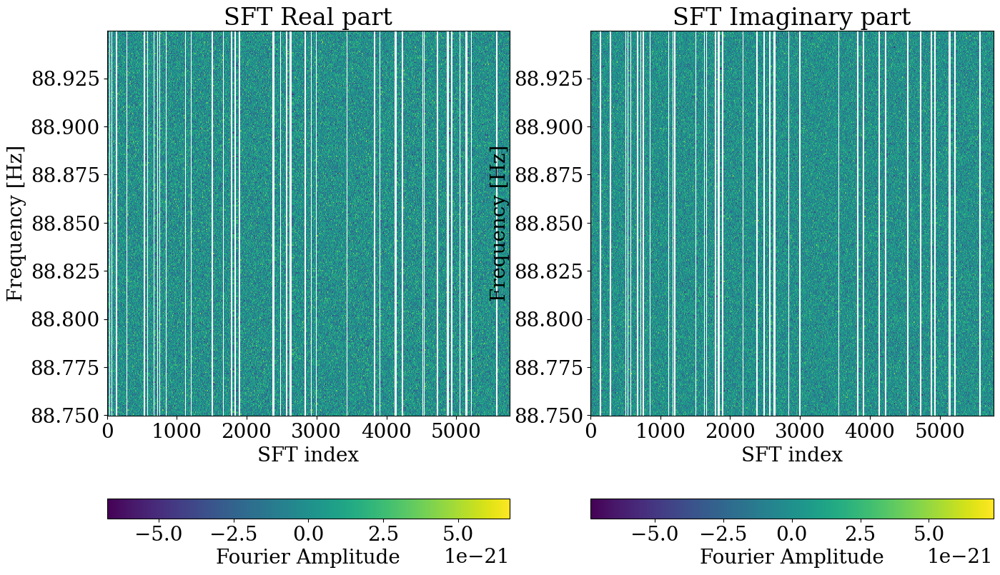

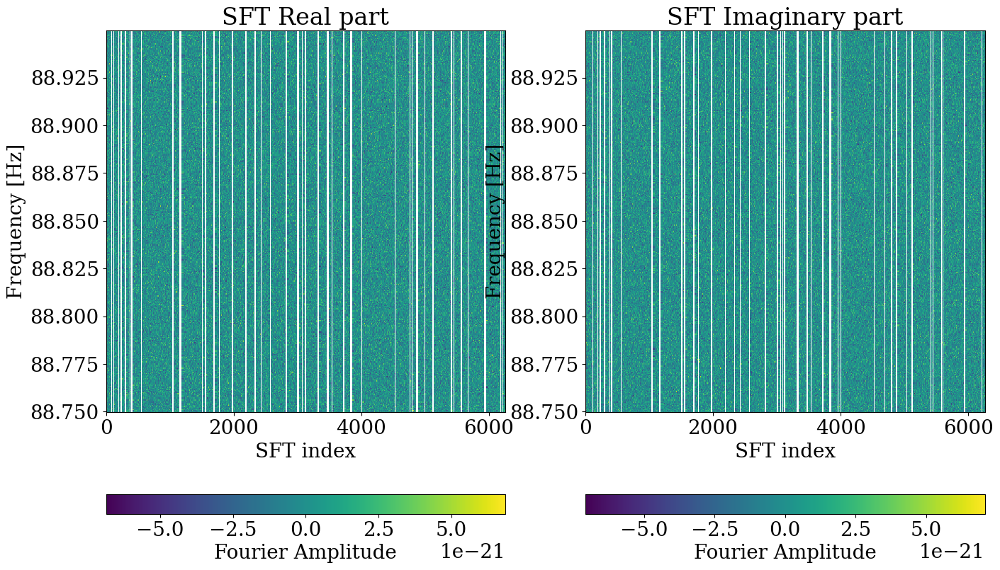

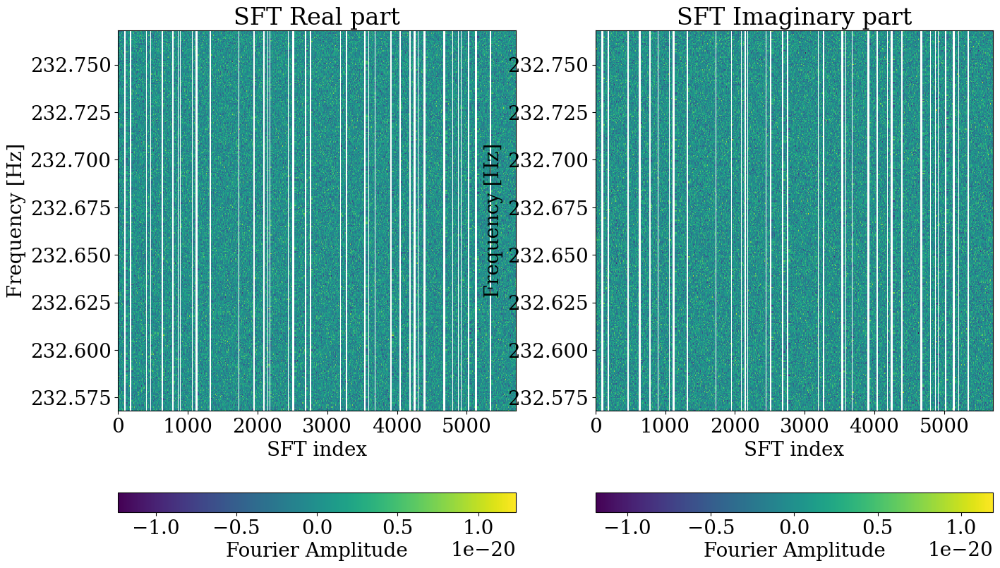

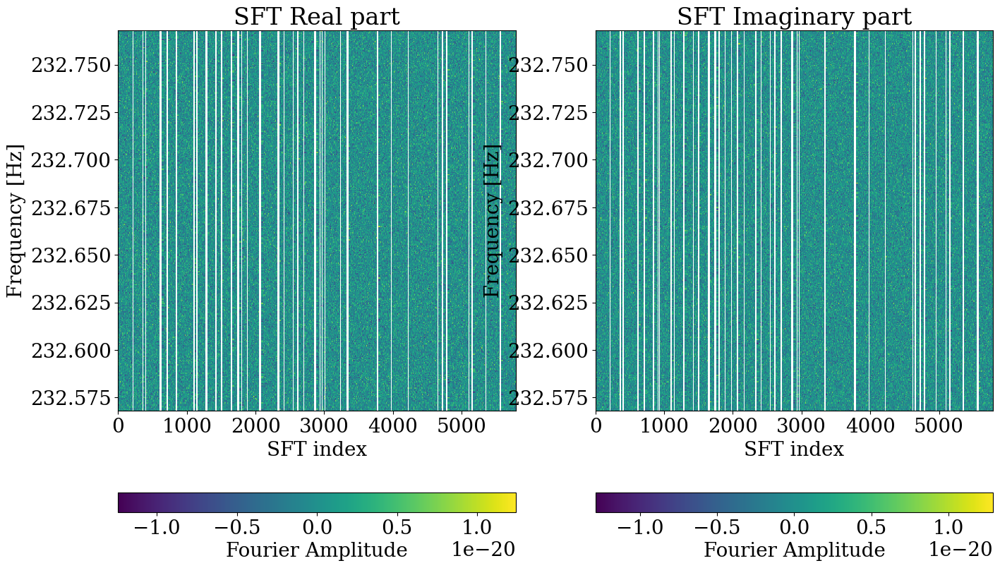

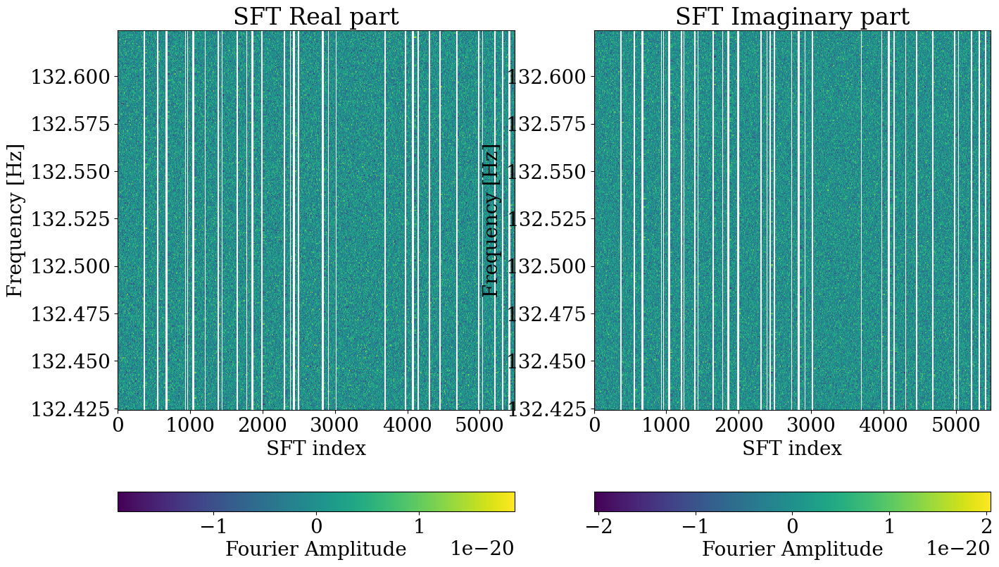

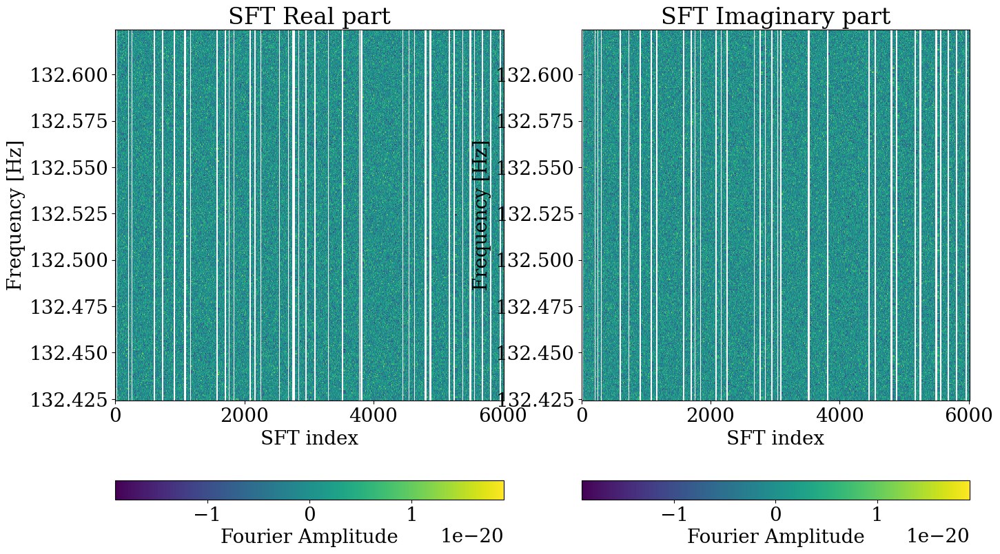

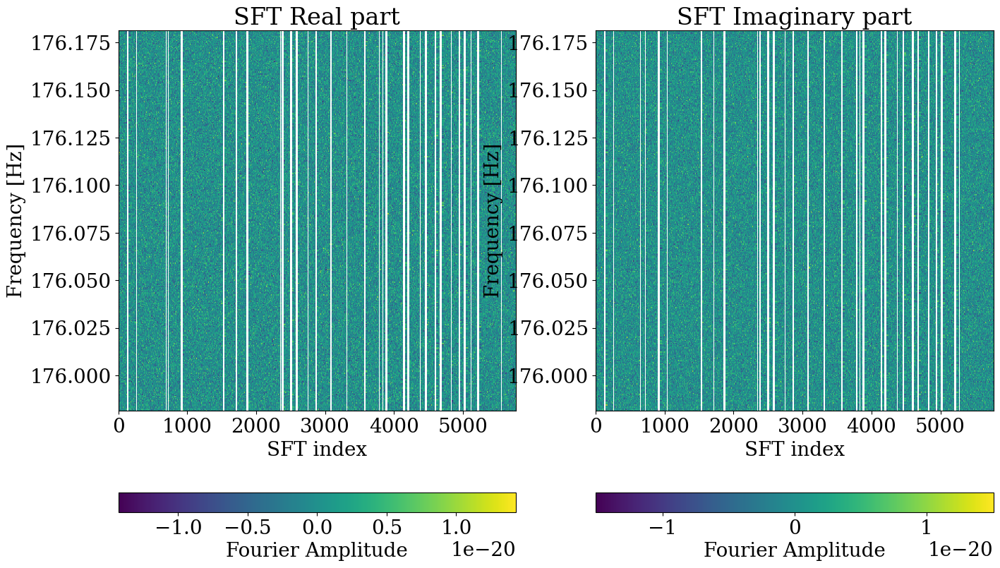

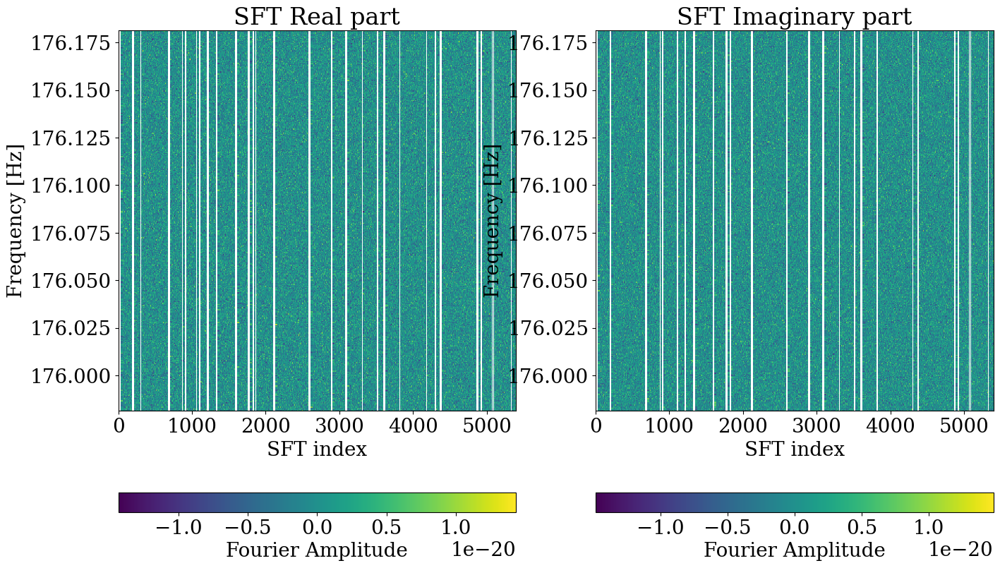

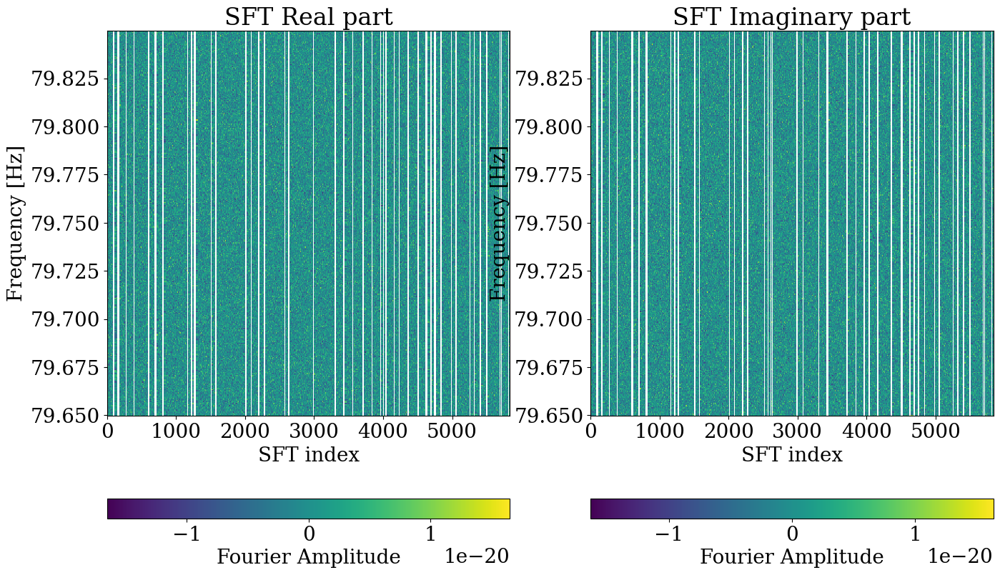

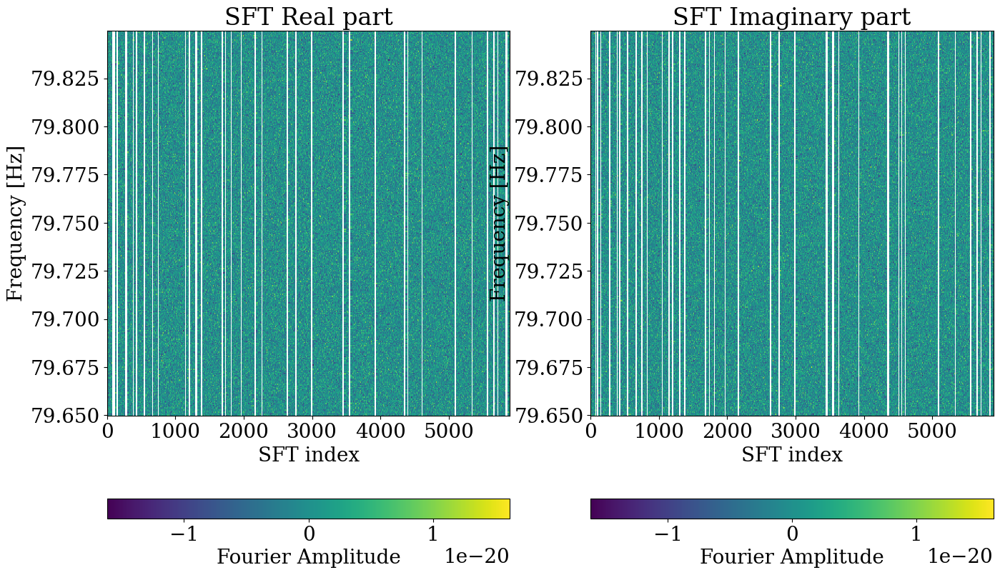

In [15]:
os.makedirs(f"{OUTDIR}/spec_image_sample", exist_ok=True)

h_paths = sorted(glob.glob(f"{OUTDIR}/*_gap.hdf5"))[:5]
for ii, h_path in enumerate(h_paths):
    file_id = Path(h_path).stem

    freq, h1_a, l1_a, h1_t, l1_t = load_hdf5(h_path)
    print(freq.shape)
    print(h1_a.shape, l1_a.shape)
    print(h1_t.shape, l1_t.shape)

    h1_ts_gaps = h1_t[1:] - h1_t[:-1] - 1800
    print("h1 sum gap:",  round(sum(h1_ts_gaps) / (24*3600), 2) , "days")
    #print(list(h1_ts_gaps))

    l1_ts_gaps = l1_t[1:] - l1_t[:-1] - 1800
    print("l1 sum gap:",  round(sum(l1_ts_gaps) / (24*3600), 2) , "days")
    #print(list(l1_ts_gaps))

    #fig_h1, axs = tutorial_utils.plot_real_imag_spectrograms(h1_t, freq, h1_a)
    #fig_l1, axs = tutorial_utils.plot_real_imag_spectrograms(l1_t, freq, l1_a)
    fig_gap_h1, axs = tutorial_utils.plot_real_imag_spectrograms_with_gaps(h1_t, freq, h1_a, 1800)
    fig_gap_l1, axs = tutorial_utils.plot_real_imag_spectrograms_with_gaps(l1_t, freq, l1_a, 1800)
    
    #fig_h1.savefig(f"{OUTDIR}/spec_image_sample/{file_id}_fig_h1.png")
    #fig_l1.savefig(f"{OUTDIR}/spec_image_sample/{file_id}_fig_l1.png")
    fig_gap_h1.savefig(f"{OUTDIR}/spec_image_sample/{file_id}_fig_gap_h1.png")
    fig_gap_l1.savefig(f"{OUTDIR}/spec_image_sample/{file_id}_fig_gap_l1.png")